
Written by: Leam Howe \
Adapted from work by David Hogg, Fangjun Li, Fengming Lin available at https://github.com/lfj95/SENSE2023/tree/main

# Semantic segmentation of Aerial Imaginary with U-Net-like architectures



This notebook is a simple semantic segmentation program. The goal is to build and train a model which is able to automatically label each pixel in an aerial image with its semantic category. 

The dataset we use consists of aerial imagery of Dubai obtained by MBRSC satellites and annotated with pixel-wise semantic segmentation in 6 classes. The total volume of the dataset is 1305 256*256 images grouped into 6 larger tiles. The classes are: 
* Building 
* Land (unpaved area) 
* Road 
* Vegetation 
* Water 
* Unlabeled

U-Net is a convolutional neural network architecture originally developed for the segmentation of medical images ([Ronneberger et al., 2015](https://arxiv.org/abs/1505.04597)), but is now widely used outside this domain. There is more information on U-Net [here](https://towardsdatascience.com/u-net-b229b32b4a71).


![Diagram of U-Net architecture](images/u-net_architecture.png)

<!-- ![Diagram of U-Net architecture](https://www.researchgate.net/profile/Alan-Jackson-2/publication/323597886/figure/fig2/AS:601386504957959@1520393124691/Convolutional-neural-network-CNN-architecture-based-on-UNET-Ronneberger-et-al.png) -->

### Run on GPU

For model runtime speed, check Collab is running on GPU. 

Click the “**Runtime**” dropdown menu. Select “**Change runtime type**”. Now select '**GPU**' in the “**Hardware accelerator**” dropdown menu. 


### Environment
We need to install some extract packages before we start

In [ ]:
# %pip install torchgeo scikit-learn lightning

### Imports

In [16]:
import tempfile
from collections.abc import Callable, Iterable
from pathlib import Path

# import kornia.augmentation as K
import matplotlib.pyplot as plt
import numpy as np
import torch

import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
from matplotlib import colors as mcolors

from collections.abc import Callable
from pathlib import Path
from typing import Optional, Dict

import matplotlib.pyplot as plt
from PIL import Image
from torch import Tensor
from torchgeo.datasets import NonGeoDataset
from torchvision.transforms import ToTensor

%matplotlib inline
%load_ext tensorboard

import os
import tempfile

import torch
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger

from torchgeo.trainers import SemanticSegmentationTask


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [2]:
# tmp_path = '~/tmp/surface_water/'
# utils.download_and_extract_archive(
#     'https://hf.co/datasets/cordmaur/earth_surface_water/resolve/main/earth_surface_water.zip',
#     tmp_path,
# )

## Overview

* Loading a dataset
* Creating a RasterDataset, DataLoaders and Samplers
* Normalising the data
* Spectral indicies
* define a unet model
* loss function and metrics
* training loop

## Overview

* Loading a dataset
* Creating a custom NonGeoDataset
* Define a unet model using TorchGeo Lightning Trainers
* Training a unet model
* Evaluating the trained segmentation model

Exercises:
1. Fine-tune your model
2. Try using pretrained weights

# Custom NonGeoDatasets
Previously we have seen examples of loading datasets that TorchGeo has made available and easy to integrate, a list of these are available [here](https://torchgeo.readthedocs.io/en/latest/api/datasets.html). But what happens if you want to use another dataset or you have created your own... 

TorchGeo has the functionality to build your own custom Dataset. More details on this can be found here: https://torchgeo.readthedocs.io/en/latest/api/datasets.html

Let's create our own custom NonGeoDataset (a dataset without georeferencing) class that will take take our dataset and prepare it for training our U-Net model.

In [3]:
class CustomNonGeoDataset(NonGeoDataset):
    """Custom dataset for semantic segmentation of satellite data.

    Dataset features:
    - Images: RGB satellite images in .jpg format.
    - Masks: Grayscale masks in .png format.
    - Classes: Binary or multi-class segmentation masks.

    Dataset format:
    - Images and masks are stored in separate directories (`images` and `mask`).
    - Filenames of images and masks match exactly (e.g., `Tile1_00_009.jpg` and `Tile1_00_009.png`).
    - Labels are stored in a .npy file, with one label per image.
    """

    def __init__(
        self,
        root: str = "data",
        split: str = "train",
        transforms: Optional[Callable[[Dict[str, Tensor]], Dict[str, Tensor]]] = None,
        download: bool = False,
    ) -> None:
        """Initialize the dataset.

        Args:
            root: Root directory where dataset is stored.
            split: One of "train", "val", or "test".
            transforms: A function/transform to apply to the input and target.
            download: If True, download the dataset (not implemented in this example).
        """
        super().__init__()
        self.root = Path(root)
        self.split = split
        self.transforms = transforms

        # Define paths for images and masks
        self.image_dir = self.root / split / "images"
        self.mask_dir = self.root / split / "mask"

        # List all image and mask files
        self.image_files = sorted(self.image_dir.glob("*.jpg"))
        self.mask_files = sorted(self.mask_dir.glob("*.png"))

        # Load labels from .npy file
        labels_path = self.root / 'labels.npy'
        if labels_path.exists():
            self.dict_load = np.load(labels_path, allow_pickle=True)
            if self.split == 'train':
                self.labels = self.dict_load.item().get('labels_train', None).squeeze()
            elif self.split == 'valid':
                self.labels = self.dict_load.item().get('labels_valid', None).squeeze()
            elif self.split == 'test':
                self.labels = self.dict_load.item().get('labels_test', None).squeeze()
            
            if self.labels is None:
                raise ValueError(f"Labels for split '{self.split}' not found in {labels_path}")
        else:
            raise FileNotFoundError(f"Labels file not found: {labels_path}")
        
        # Ensure that the number of images and masks match
        assert len(self.image_files) == len(self.mask_files), "Number of images and masks must match."

    def __len__(self) -> int:
        """Return the number of samples in the dataset."""
        return len(self.image_files)

    def __getitem__(self, index: int) -> Dict[str, Tensor]:
        """Return a single sample (image and mask) from the dataset.

        Args:
            index: Index of the sample to retrieve.

        Returns:
            A dictionary containing the image and mask as tensors.
        """
        # Load image
        img_path = self.image_files[index]
        img = Image.open(img_path).convert("RGB")  # Ensure 3 channels (RGB)
        

        # Convert to tensors
        img_tensor = ToTensor()(img)
        # print(f"image tensor shape: {img_tensor.shape}")  # Debug print
        
        # mask_tensor = ToTensor()(mask)
        # print(f"Labels: {self.labels}")  # Debug print
        # print(f"Labels: {self.labels.shape}")  # Debug print
        labels_tensor = torch.from_numpy(self.labels[index]).squeeze().long() # Convert to long tensor (e.g. float32 -> int64)
        # print(f"Labels tensor shape: {labels_tensor.shape}")

        # Apply transforms if provided
        # sample = {"image": img_tensor, "mask": mask_tensor}
        sample = {"image": img_tensor, "mask": labels_tensor}
        if self.transforms:
            sample = self.transforms(sample)

        return sample

    def plot(self,  index: int) -> plt.Figure:
        """Plot a sample from the dataset.

        Args:
            index: Index of the sample to plot.

        Returns:
            A matplotlib figure showing the image and mask.
        """
        sample = self[index]
        img = sample["image"].permute(1, 2, 0).numpy()  # Convert to HWC format
        mask = sample["mask"].squeeze().numpy()  # Remove channel dimension

        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(img)
        ax[0].set_title("Image")
        ax[1].imshow(mask, 
                     vmin=1, 
                     vmax=6
                    #  cmap=cmap
                     )
        ax[1].set_title("Mask")
        plt.tight_layout()

        return fig

## Dataloaders

In [4]:
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor, Resize

# Define transforms (optional)
# For example, resize images and masks to 512x512 and convert them to tensors
transforms = Compose([
    # Resize((512, 512)),  # Resize images and masks to 512x512
    # ToTensor(),           # Convert images and masks to PyTorch tensors
])

# Create datasets
train_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="train", transforms=transforms)
val_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="valid", transforms=transforms)
test_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="test", transforms=transforms)

# Define batch size
batch_size = 8  # Adjust as needed

# Create DataLoaders
train_dataloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,  # Shuffle the training data
    num_workers=4,  # Number of subprocesses for data loading
    pin_memory=True,  # Speed up data transfer to GPU
)

val_dataloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,  # Do not shuffle validation data
    num_workers=4,  # Number of subprocesses for data loading
    pin_memory=True,  # Speed up data transfer to GPU
)

test_dataloader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,  # Do not shuffle test data
    num_workers=4,  # Number of subprocesses for data loading
    pin_memory=True,  # Speed up data transfer to GPU
)


# Print details
print(f"Training DataLoader: {len(train_dataloader)} batches of size {batch_size}")
print(f"Validation DataLoader: {len(val_dataloader)} batches of size {batch_size}")
print(f"Test DataLoader: {len(test_dataloader)} batches of size {batch_size}")


Training DataLoader: 98 batches of size 8
Validation DataLoader: 33 batches of size 8
Test DataLoader: 33 batches of size 8


## Visualise Batch

In [5]:
# Define the colormap
class_names = ['Building', 'Road', 'Land', 'Vegetation', 'Water', 'Unlabeled']
cmap = mcolors.ListedColormap([
    '#3C1098',  # Building
    '#8429F6',  # Road
    '#6EC1E4',  # Land (unpaved area)
    '#FEDD3A',  # Vegetation
    '#E2A929',  # Water
    '#9B9B9B'   # Unlabeled
])

In [21]:


# Function to visualize a specific batch of images and masks
def visualise_batch(dataloader, batch_idx=0):
    """
    Visualize a specific batch of images and masks from a dataloader.

    Args:
        dataloader (DataLoader): The dataloader containing the dataset.
        batch_idx (int): The index of the batch to visualize.
    """
    # Iterate through the dataloader to the specified batch
    for i, batch in enumerate(dataloader):
        if i == batch_idx:
            images = batch['image']
            masks = batch['mask']
            break
    else:
        raise ValueError(f"Batch index {batch_idx} is out of range for the dataloader.")

    # Plot the images and masks
    batch_size = images.size(0)
    fig, axes = plt.subplots(batch_size, 2, figsize=(10, batch_size * 5))
    
    for i in range(batch_size):
        img = F.to_pil_image(images[i])
        
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(masks[i], 
                          cmap=cmap,
                          vmin=1,
                          vmax=5
                          )
        axes[i, 1].set_title("Mask")
        axes[i, 1].axis("off")
        
        # Add legend
        legend_handles = [plt.Rectangle((0, 0), 1, 1, color=cmap(i)) for i in range(len(class_names))]
        axes[i, 1].legend(legend_handles, class_names, loc='upper right')
    
    plt.tight_layout()
    plt.show()

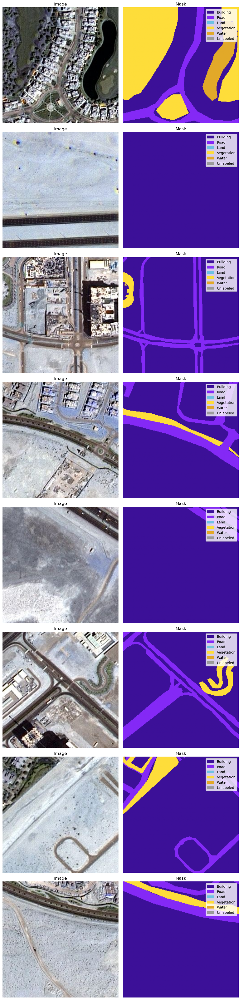

In [7]:
visualise_batch(train_dataloader, batch_idx=0)

## Segmentation Model

In [6]:
# import pytorch_lightning as pl
from torchgeo.trainers import SemanticSegmentationTask

# Define the task
task = SemanticSegmentationTask(
    loss='ce',  # Cross-entropy loss
    model='unet',  # U-Net model
    in_channels=3,  # Input channels (e.g., RGB images)
    num_classes=6,  # Number of output classes
    lr=0.001,  # Learning rate
    patience=10,  # Patience for early stopping
)

## Training Loop

The training function should receive the number of epochs, the model, the dataloaders, the loss function (to be optimized) the accuracy function (to assess the results), the optimizer (that will adjust the parameters of the model in the correct direction) and the transformations to be applied to each batch.

In [7]:
# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [8]:
batch_size = 8
num_workers = 2
max_epochs = 50
fast_dev_run = False

In [9]:
accelerator = 'gpu' if torch.cuda.is_available() else 'cpu'
default_root_dir = os.path.join('./', 'experiments')
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss', dirpath=default_root_dir, save_top_k=1, save_last=True
)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10)
logger = TensorBoardLogger(save_dir=default_root_dir, name='tutorial_logs')

In [10]:
# def training_step(self, batch, batch_idx):
#     x, y = batch
#     y_hat = self(x)
#     loss = self.loss_fn(y_hat, y)
#     accuracy = (y_hat.argmax(dim=1) == y).float().mean()

#     # Log loss and accuracy
#     self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
#     self.log('train_acc', accuracy, on_step=True, on_epoch=True, prog_bar=True)

#     return loss

In [23]:
from lightning.pytorch.callbacks import TQDMProgressBar

trainer = Trainer(
    accelerator=accelerator,
    callbacks=[checkpoint_callback, early_stopping_callback, TQDMProgressBar(refresh_rate=10)],
    # fast_dev_run=fast_dev_run,
    log_every_n_steps=1,
    logger=logger,
    min_epochs=1,
    max_epochs=max_epochs,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [30]:
# history = 
trainer.fit(model=task, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

/exports/csce/datastore/geos/users/s2112771/miniforge3/envs/sensebook/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /exports/csce/datastore/geos/users/s2112771/sense_cpd/sense_book/book/3_ml4eo/3_sat_ml_deep/experiments exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.5 M | train
1 | criterion     | CrossEntropyLoss | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollection | 0      | train
4 | test_metrics  | MetricCollection | 0      | train
-----------------------------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.087   Total estimated model par

Epoch 38: 100%|██████████| 98/98 [00:11<00:00,  8.57it/s, v_num=2]         


In [31]:
# test_dataset = CustomNonGeoDataset(root="./dubai_segmentation", split="test", transforms=transforms)
# test_dataloader = DataLoader(
#     test_dataset,
#     batch_size=batch_size,
#     shuffle=False,  # Do not shuffle test data
#     num_workers=num_workers,  # Number of subprocesses for data loading
#     pin_memory=True,  # Speed up data transfer to GPU
# )

In [32]:
trainer.test(model=task, dataloaders=test_dataloader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████| 33/33 [00:00<00:00, 47.59it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.8341513276100159
test_MulticlassJaccardIndex    0.7154885530471802
         test_loss             0.4819890260696411
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4819890260696411,
  'test_MulticlassAccuracy': 0.8341513276100159,
  'test_MulticlassJaccardIndex': 0.7154885530471802}]

In [36]:
trainer.test(model=task, dataloaders=test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.8310921788215637
test_MulticlassJaccardIndex    0.7109988927841187
         test_loss             0.5420687794685364
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.5420687794685364,
  'test_MulticlassAccuracy': 0.8310921788215637,
  'test_MulticlassJaccardIndex': 0.7109988927841187}]

## Visualise results

In [11]:
# Load the model from the checkpoint
task = SemanticSegmentationTask.load_from_checkpoint('./experiments/last-v3.ckpt', )
task.eval()

SemanticSegmentationTask(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (r

In [25]:
trainer.test(model=task, dataloaders=test_dataloader)

/exports/csce/datastore/geos/users/s2112771/miniforge3/envs/sensebook/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /exports/csce/datastore/geos/users/s2112771/miniforg ...
You are using a CUDA device ('NVIDIA L4') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.8192617893218994
test_MulticlassJaccardIndex    0.6938555836677551
         test_loss             0.38248372077941895
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.38248372077941895,
  'test_MulticlassAccuracy': 0.8192617893218994,
  'test_MulticlassJaccardIndex': 0.6938555836677551}]

In [12]:
task.eval()  # Disable dropout and batch normalization
task.freeze()  # Freeze the model for inference

# Initialize lists to store predictions and ground truth masks
all_preds = []
all_masks = []

with torch.no_grad():
    # Get a batch of test data
    batch = next(iter(test_dataloader))
    images = batch['image'].to('cuda')
    masks = batch['mask'].to('cuda')
    
    # Make predictions
    predictions = task(images)
    # Convert predictions to masks
    predicted_masks = torch.argmax(predictions, dim=1)

    # Store predictions and ground truth masks
    all_preds.append(predictions.cpu())  # Move predictions to CPU
    all_masks.append(masks.cpu())  # Move masks to CPU

# Concatenate predictions and ground truth masks
all_preds = torch.cat(all_preds)
all_masks = torch.cat(all_masks)

In [27]:
# Function to visualize a batch of images and masks
def visualise_batch(dataloader, predicted_masks):
    # Get a batch of training data
    batch = next(iter(dataloader))
    images = batch['image'].cpu()
    masks = batch['mask'].cpu()
    
    # Plot the images and masks
    batch_size = images.size(0)
    fig, axes = plt.subplots(batch_size, 3, figsize=(15, batch_size * 5))
    
    for i in range(batch_size):
        img = F.to_pil_image(images[i])
        mask = masks[i]
        predicted_mask = predicted_masks[i].cpu()
        
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(mask, cmap=cmap, vmin=1, vmax=5)
        axes[i, 1].set_title("Mask")
        axes[i, 1].axis("off")
        
        axes[i, 2].imshow(predicted_mask, cmap=cmap, vmin=1, vmax=5)
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis("off")
    
        # Add legend
        # legend_labels = ['Building', 'Land', 'Road', 'Vegetation', 'Water', 'Unlabeled']
        # legend_labels = ['Water', 'Land (unpaved area)', 'Road', 'Building', 'Vegetation', 'Unlabelled']
        legend_handles = [plt.Rectangle((0, 0), 1, 1, color=cmap(i)) for i in range(len(class_names))]
        axes[i, 2].legend(legend_handles, class_names)
    
    plt.tight_layout()
    plt.show()

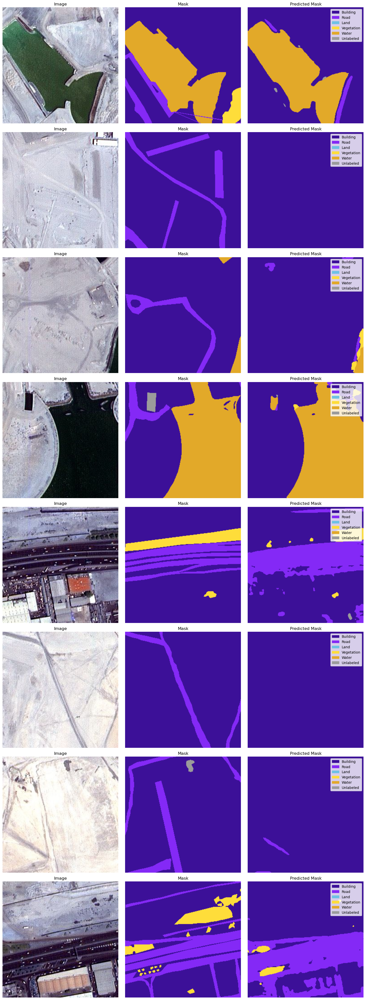

In [28]:
visualise_batch(test_dataloader, predicted_masks)

In [15]:
from torchmetrics import ConfusionMatrix

# Define the number of classes
num_classes = 6  # Adjust based on your dataset

# Initialize the confusion matrix
conf_matrix = ConfusionMatrix(task="multiclass", num_classes=num_classes)

# Compute the confusion matrix
conf_matrix.update(all_preds, all_masks)
conf_matrix = conf_matrix.compute()

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_confusion_matrix(conf_matrix, class_names, normalize=False, cmap='Blues'):
    """
    Plot a confusion matrix.

    Args:
        conf_matrix (torch.Tensor or numpy.ndarray): Confusion matrix.
        class_names (list): List of class names.
        normalize (bool): Whether to normalize the confusion matrix.
    """
    if isinstance(conf_matrix, torch.Tensor):
        conf_matrix = conf_matrix.cpu().numpy()

    if normalize:
        conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='.2f' if normalize else 'd', cmap=cmap,
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Normalized Confusion Matrix' if normalize else 'Confusion Matrix')
    plt.show()



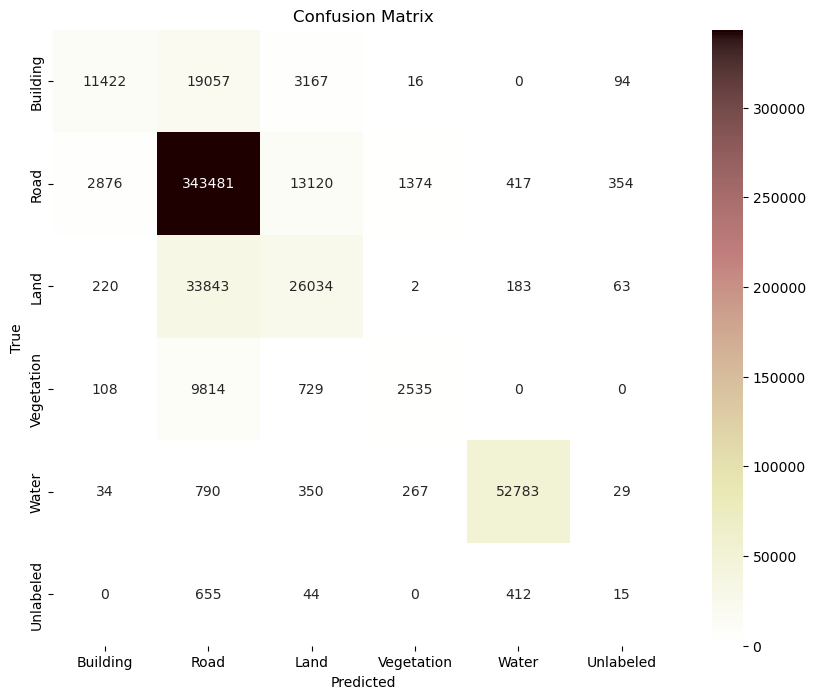

In [23]:
# Plot the normalized confusion matrix
plot_confusion_matrix(conf_matrix, class_names, cmap='pink_r')


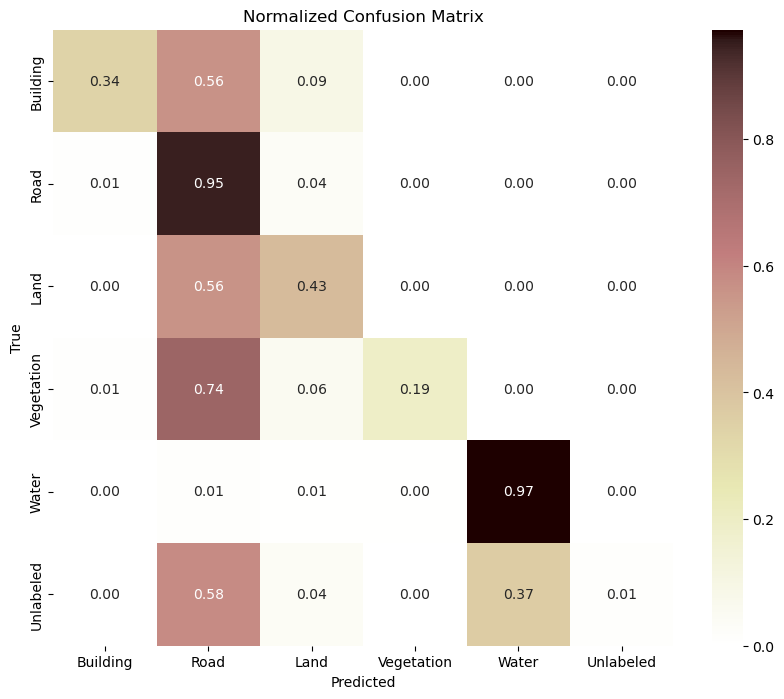

In [24]:
# Plot the normalized confusion matrix
plot_confusion_matrix(conf_matrix, class_names, normalize=True, cmap='pink_r')
# plot_confusion_matrix(conf_matrix, class_names, normalize=True, cmap='bone_r')

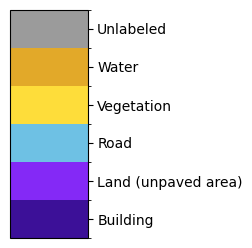

In [129]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Define the colormap
cmap = mcolors.ListedColormap([
    '#3C1098',  # Building
    '#8429F6',  # Land (unpaved area)
    '#6EC1E4',  # Road
    '#FEDD3A',  # Vegetation
    '#E2A929',  # Water
    '#9B9B9B'   # Unlabeled
])

# Define the labels for each color
labels = ['Building', 'Land (unpaved area)', 'Road', 'Vegetation', 'Water', 'Unlabeled']

# Create a figure and axis
fig, ax = plt.subplots(figsize=(1, 6))
fig.subplots_adjust(bottom=0.5)

# Create a colorbar
bounds = np.arange(len(labels) + 1)  # Define boundaries for each color
norm = mcolors.BoundaryNorm(bounds, cmap.N)
cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                  cax=ax, orientation='vertical', ticks=bounds[:-1] + 0.5)
cb.set_ticklabels(labels)  # Set the labels for the colorbar

# Display the colorbar
plt.show()

In [13]:
def train_loop(
    epochs: int,
    train_dl: DataLoader,
    val_dl: DataLoader | None,
    model: torch.nn.Module,
    loss_fn: Callable,
    optimizer: torch.optim.Optimizer,
    acc_fns: list | None = None,
    batch_tfms: Callable | None = None,
    ):
    # size = len(dataloader.dataset)
    cuda_model = model.to(device)

    for epoch in range(epochs):
        accum_loss = 0
        for batch in train_dl:
            if batch_tfms is not None:
                X = batch_tfms(batch['image']).to(device)
            else:
                X = batch['image'].to(device)

            y = batch['mask'].type(torch.long).to(device)
            pred = cuda_model(X)['out']
            loss = loss_fn(pred, y)

            # BackProp
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # update the accum loss
            accum_loss += float(loss) / len(train_dl)

        # Testing against the validation dataset
        if acc_fns is not None and val_dl is not None:
            # reset the accuracies metrics
            acc = [0.0] * len(acc_fns)

            with torch.no_grad():
                for batch in val_dl:
                    if batch_tfms is not None:
                        X = batch_tfms(batch['image']).to(device)
                    else:
                        X = batch['image'].type(torch.float32).to(device)

                    y = batch['mask'].type(torch.long).to(device)

                    pred = cuda_model(X)['out']

                    for i, acc_fn in enumerate(acc_fns):
                        acc[i] = float(acc[i] + acc_fn(pred, y) / len(val_dl))

            # at the end of the epoch, print the errors, etc.
            print(
                f'Epoch {epoch}: Train Loss={accum_loss:.5f} - Accs={[round(a, 3) for a in acc]}'
            )
        else:
            print(f'Epoch {epoch}: Train Loss={accum_loss:.5f}')

## Exercises


### Exercise 1: Finetune the segmentation model 

Now try adjusting the model by implementing different methods of reducing overfitting and increasing the model's ability to generalise.

1. Retrain the model by using or adding a different loss function and see what happens to the performance of the segmentation model. 
 >Hint: Further details for loss options can be found in the [TorchGeo SemanticSegmentationTask documentation](https://torchgeo.readthedocs.io/en/latest/api/trainers.html#torchgeo.trainers.SemanticSegmentationTask)








 














In [19]:
# Define the task
task = SemanticSegmentationTask(
    loss='jaccard',  # Cross-entropy loss (default)
    model='unet',  # U-Net model
    in_channels=3,  # Input channels (e.g., RGB images)
    num_classes=6,  # Number of output classes
    lr=0.001,  # Learning rate
    patience=10,  # Patience for early stopping
)

In [27]:
# Train the model with updated task
trainer.fit(model=task, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

INFO: You are using a CUDA device ('NVIDIA L4') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:lightning.pytorch.utilities.rank_zero:You are using a CUDA device ('NVIDIA L4') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/exports/csce/datastore/geos/users/s2112771/miniforge3/envs/sensebook/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /exports/csce/datastore/geos/users/s2112771/sense_cpd/sense_book/book/3_ml4eo/

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [29]:
# Evaluate results on test set
trainer.test(model=task, dataloaders=test_dataloader)

/exports/csce/datastore/geos/users/s2112771/miniforge3/envs/sensebook/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /exports/csce/datastore/geos/users/s2112771/miniforg ...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.8192617893218994
test_MulticlassJaccardIndex    0.6938555836677551
         test_loss             0.38248372077941895
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.38248372077941895,
  'test_MulticlassAccuracy': 0.8192617893218994,
  'test_MulticlassJaccardIndex': 0.6938555836677551}]

## Exercise 2: Try another model architecture
Change the network architecture to U-net with Resnet backbone. Use pretrainded weights to initialize it, available pretrained weights are listed [here](https://torchgeo.readthedocs.io/en/latest/api/models.html#pretrained-weights).

> Hint: Torgeo Lightning Trainers have a <code>backbone</code> option, see the [documentation](https://torchgeo.readthedocs.io/en/latest/api/trainers.html#torchgeo.trainers.SemanticSegmentationTask). There are numerous backbone options available from [smp](https://smp.readthedocs.io/en/latest/models.html) and [timm](https://smp.readthedocs.io/en/latest/encoders_timm.html) that are easy to integrate (try Resnet or another of your choice). All backbones have pre-trained weights for faster and better convergence.



In [17]:
# Define the task
task = SemanticSegmentationTask(
    loss='ce',  # Cross-entropy loss
    model='unet',  # U-Net model
    backbone='resnet18',  # ResNet-18 backbone
    weights = 'ResNet18_Weights.SENTINEL2_RGB_MOCO',  # Pre-trained weights
    in_channels=3,  # Input channels (e.g., RGB images)
    num_classes=6,  # Number of output classes
    lr=0.001,  # Learning rate
    patience=10,  # Patience for early stopping
)

In [22]:
# Define the task
task = SemanticSegmentationTask(
    loss='jaccard',  # Cross-entropy loss
    model='unet',  # U-Net model
    backbone='resnet50',  # ResNet-18 backbone
    weights = 'ResNet50_Weights.FMOW_RGB_GASSL',  # Pre-trained weights
    in_channels=3,  # Input channels (e.g., RGB images)
    num_classes=6,  # Number of output classes
    lr=0.001,  # Learning rate
    patience=10,  # Patience for early stopping
)

Downloading: "https://hf.co/torchgeo/resnet50_fmow_rgb_gassl/resolve/fe8a91026cf9104f1e884316b8e8772d7af9052c/resnet50_fmow_rgb_gassl-da43d987.pth" to /home/s2112771/.cache/torch/hub/checkpoints/resnet50_fmow_rgb_gassl-da43d987.pth
100%|██████████| 90.0M/90.0M [00:00<00:00, 197MB/s]


In [25]:
def configure_optimizers(self):
    return torch.optim.Adam(self.task.model.parameters(), lr=self.hparams['lr'])

# Train the model with updated task
trainer.fit(model=task, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | Unet             | 32.5 M | train
1 | criterion     | JaccardLoss      | 0      | train
2 | train_metrics | MetricCollection | 0      | train
3 | val_metrics   | MetricCollection | 0      | train
4 | test_metrics  | MetricCollection | 0      | train
-----------------------------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.087   Total estimated model params size (MB)
233       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [26]:
# Evaluate results on test set
trainer.test(model=task, dataloaders=test_dataloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.8430196642875671
test_MulticlassJaccardIndex    0.7286378741264343
         test_loss             0.3561114966869354
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.3561114966869354,
  'test_MulticlassAccuracy': 0.8430196642875671,
  'test_MulticlassJaccardIndex': 0.7286378741264343}]